In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
import os 
os.chdir("/content/drive/MyDrive/AI/dataset/CNN/Shoe Classification")

In [8]:
pwd

'/content/drive/MyDrive/AI/dataset/CNN/Shoe Classification'

In [9]:
!ls

flagged  model_ANN_exam.h5  test  train


In [5]:
!pip install tensorflow-gpu==2.0.0

     |████████████████████████████████| 380.8 MB 39 kB/s 
     |████████████████████████████████| 449 kB 57.8 MB/s 
     |████████████████████████████████| 3.8 MB 41.1 MB/s 
     |████████████████████████████████| 50 kB 6.4 MB/s 
  Created wheel for gast: filename=gast-0.2.2-py3-none-any.whl size=7554 sha256=db36cbfab6476e4391436dcbc23e6841f9f806c2a043bf5fabd69811e1d137d8
  Stored in directory: /root/.cache/pip/wheels/21/7f/02/420f32a803f7d0967b48dd823da3f558c5166991bfd204eef3
Successfully built gast
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.8.0
    Uninstalling tensorboard-2.8.0:
      Successfully uninstalled tensorboard-2.8.0
  Attempting uninstall: gast
    Found existing installation: gast 0.5.3
    Uninstalling gast-0.5.3:
      Succes

In [10]:
# import the necessary packages
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import to_categorical

from sklearn.model_selection import train_test_split

from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import random
import cv2
import os

import warnings
from tqdm import tqdm_notebook as tqdm
import itertools

print(tf.__version__)

warnings.filterwarnings("ignore")
SEED = 42   # set random seed


2.0.0


In [11]:
pwd


'/content/drive/MyDrive/AI/dataset/CNN/Shoe Classification'

In [12]:
!ls

flagged  model_ANN_exam.h5  test  train


In [13]:
a=list(paths.list_images("train"))

In [14]:
a[3]

'train/Boots/boots (1).jpg'

In [15]:
# create CNN Model

class LeNet:
    @staticmethod
    def build(width, height, depth, classes):
        # initialize the model
        model = Sequential()
        inputShape = (height, width, depth)

        # if we are using "channels first", update the input shape
        if K.image_data_format() == "channels_first":
            inputShape = (depth, height, width)

        # first set of CONV => RELU => POOL layers
        model.add(Conv2D(20, (5, 5), padding="same",input_shape=inputShape))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # second set of CONV => RELU => POOL layers
        model.add(Conv2D(50, (5, 5), padding="same"))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # first (and only) set of FC => RELU layers
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation("relu"))

        # softmax classifier
        model.add(Dense(classes))
        model.add(Activation("softmax"))

        # return the constructed network architecture
        return model

In [16]:
# initialize the data and labels
print("[INFO] loading images...")
data = []
labels = []

# grab the image paths and randomly shuffle them
imagePaths = sorted(list(paths.list_images("train")))

random.seed(42)
random.shuffle(imagePaths)

# progress bar 
with tqdm(total=len(imagePaths)) as pbar:
    
    # loop over the input images
    for idx, imagePath in enumerate(imagePaths):
        # load the image, pre-process it, and store it in the data list
        image = cv2.imread(imagePath)
        image = cv2.resize(image, (28, 28))
        image = img_to_array(image)
        data.append(image)

        # extract the class label from the image path and update the
        # labels list
        label = imagePath.split(os.path.sep)[-2]


        if label == "Boots":
            label = 0
        elif label == "Sandals":
            label = 1
        elif label == "Slippers":
            label = 2

        labels.append(label)
        
        # update the progressbar
        pbar.update(1)

[INFO] loading images...


  0%|          | 0/778 [00:00<?, ?it/s]

In [17]:
# scale the raw pixel intensities to the range [0, 1]
data = np.array(data, dtype="float") / 255.0
labels = np.array(labels)

In [18]:
print(len(data))
print(len(labels))


778
778


In [19]:
# partition the data into training and testing splits using 75% of
# the data for training and the remaining 25% for testing
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size=0.25, random_state=42)

In [20]:
print("Train x SHAPE: ", trainX.shape)
print("Test x SHAPE: ", testX.shape)

Train x SHAPE:  (583, 28, 28, 3)
Test x SHAPE:  (195, 28, 28, 3)


In [21]:
print(len(testY), len(trainY))

195 583


In [22]:
testY

array([0, 0, 1, 0, 0, 1, 0, 2, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 2, 2,
       0, 0, 0, 0, 2, 0, 0, 1, 1, 0, 2, 1, 2, 1, 1, 1, 0, 1, 1, 2, 1, 1,
       1, 0, 1, 0, 0, 1, 1, 0, 2, 2, 1, 0, 0, 0, 1, 2, 0, 0, 0, 0, 1, 1,
       2, 2, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 2, 0, 1, 0, 2, 1,
       2, 2, 1, 0, 2, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0,
       2, 0, 0, 0, 1, 2, 0, 1, 1, 2, 0, 1, 2, 0, 2, 0, 2, 0, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 2, 1, 0, 2, 0, 2, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       2, 0, 0, 1, 1, 1, 2, 1, 1, 0, 1, 0, 0, 2, 2, 0, 2, 1, 0, 2, 0, 1,
       1, 2, 2, 1, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 1])

In [23]:
# convert the labels from integers to vectors
trainY = to_categorical(trainY, num_classes=3)
testY = to_categorical(testY, num_classes=3)

In [24]:
testY[:10]

array([[1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.]], dtype=float32)

In [25]:
# construct the image generator for data augmentation
aug = ImageDataGenerator(rotation_range=30, 
                         width_shift_range=0.1, 
                         height_shift_range=0.1, 
                         shear_range=0.2, 
                         zoom_range=0.2, 
                         horizontal_flip=True, 
                         fill_mode="nearest")

In [26]:
# initialize the model
print("[INFO] compiling model...")
model = LeNet.build(width=28, height=28, depth=3, classes=3)
opt = Adam()
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

print("[INFO] model complied...")


[INFO] compiling model...
[INFO] model complied...


In [27]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 28, 28, 20)        1520      
_________________________________________________________________
activation (Activation)      (None, 28, 28, 20)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 20)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 14, 50)        25050     
_________________________________________________________________
activation_1 (Activation)    (None, 14, 14, 50)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 50)          0         
_________________________________________________________________
flatten (Flatten)            (None, 2450)              0

In [28]:
EPOCHS = 30
BS = 11
# train the network
print("[INFO] training network...")
H = model.fit(x=aug.flow(trainX, trainY, batch_size=BS),
              validation_data=(testX, testY), 
              steps_per_epoch=len(trainX) // BS,
              epochs=EPOCHS, 
              verbose=1)

[INFO] training network...
Train for 53 steps, validate on 195 samples
Epoch 1/30
53/53 [==============================] - 3s 64ms/step - loss: 1.0037 - accuracy: 0.5163 - val_loss: 0.6002 - val_accuracy: 0.7333
Epoch 2/30
53/53 [==============================] - 2s 45ms/step - loss: 0.6733 - accuracy: 0.6638 - val_loss: 0.4601 - val_accuracy: 0.8256
Epoch 3/30
53/53 [==============================] - 2s 46ms/step - loss: 0.5853 - accuracy: 0.7547 - val_loss: 0.5226 - val_accuracy: 0.7282
Epoch 4/30
53/53 [==============================] - 2s 46ms/step - loss: 0.6030 - accuracy: 0.7461 - val_loss: 0.4412 - val_accuracy: 0.7949
Epoch 5/30
53/53 [==============================] - 2s 46ms/step - loss: 0.5104 - accuracy: 0.7959 - val_loss: 0.3744 - val_accuracy: 0.8667
Epoch 6/30
53/53 [==============================] - 2s 45ms/step - loss: 0.4758 - accuracy: 0.8045 - val_loss: 0.3593 - val_accuracy: 0.8667
Epoch 7/30
53/53 [==============================] - 2s 45ms/step - loss: 0.4238 - a

In [29]:
# save the model and label binarizer to disk
print("[INFO] serializing network and label binarizer...")
model.save('model_ANN_exam.h5')

[INFO] serializing network and label binarizer...


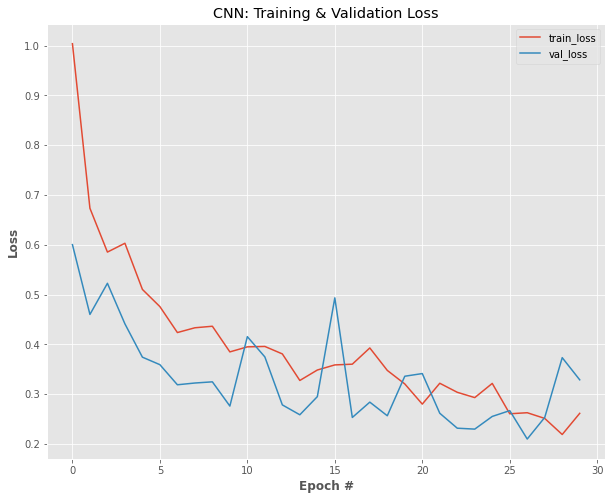

In [30]:
# plot the training and validation loss
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
plt.title("CNN: Training & Validation Loss")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Loss", weight="bold")
plt.legend()
plt.show()

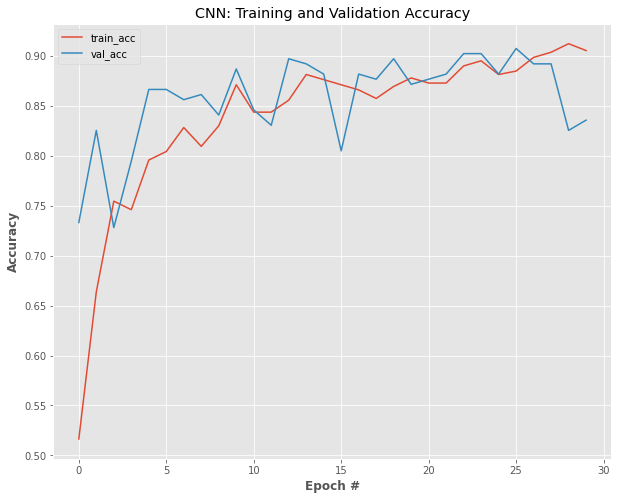

In [31]:
# plot the training and validation accuracy
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["accuracy"], label="train_acc")
plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("CNN: Training and Validation Accuracy")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Accuracy", weight="bold")
plt.legend()
plt.show()

In [32]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    plt.grid(b=None)
    ax = fig.add_subplot(111)
    ax.imshow(img)

[INFO] loading network and...


  0%|          | 0/89 [00:00<?, ?it/s]

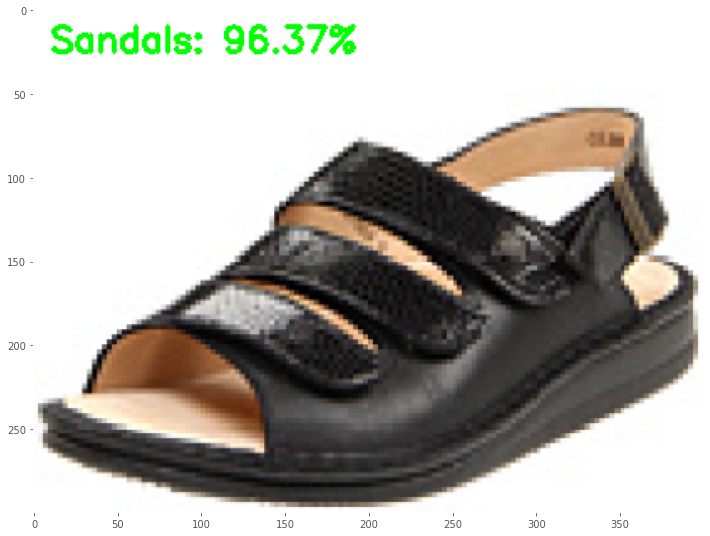

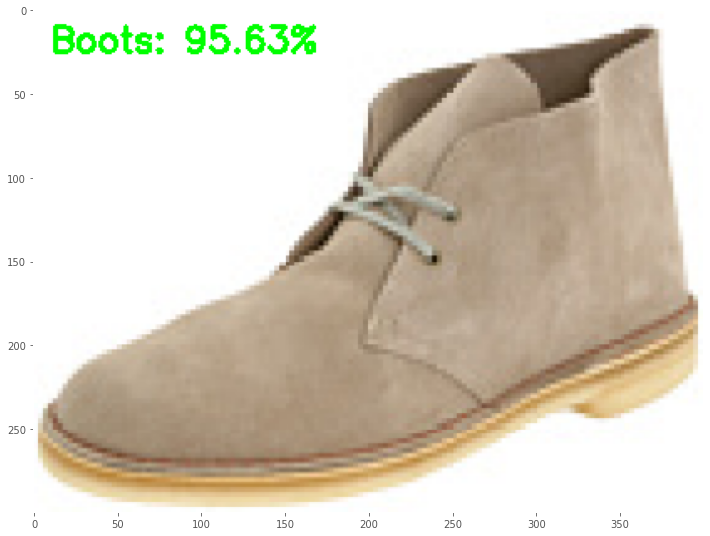

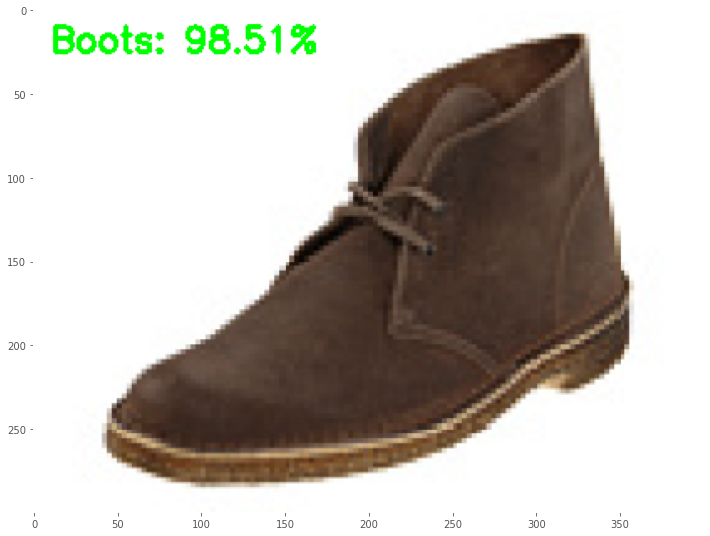

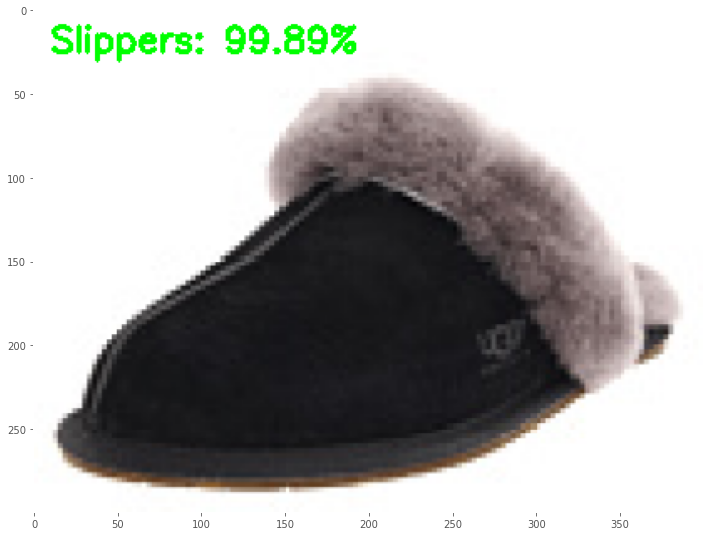

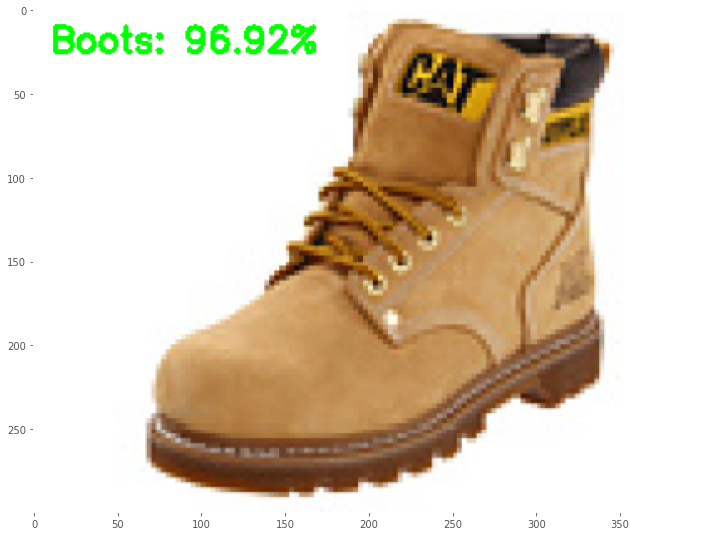

...

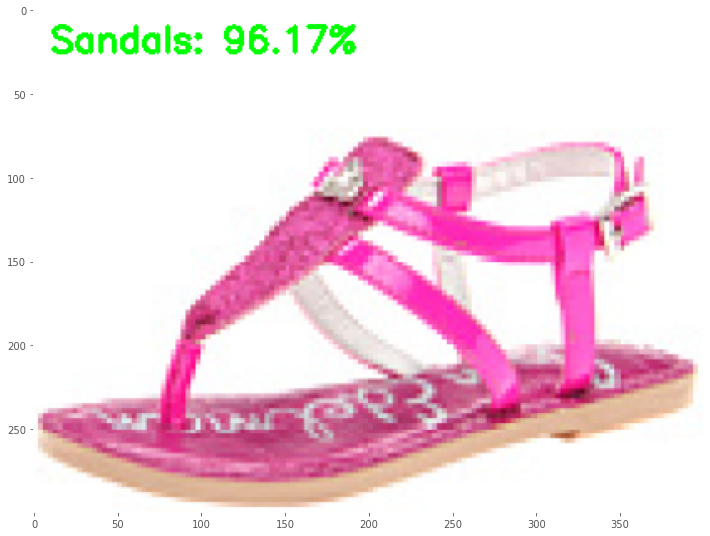

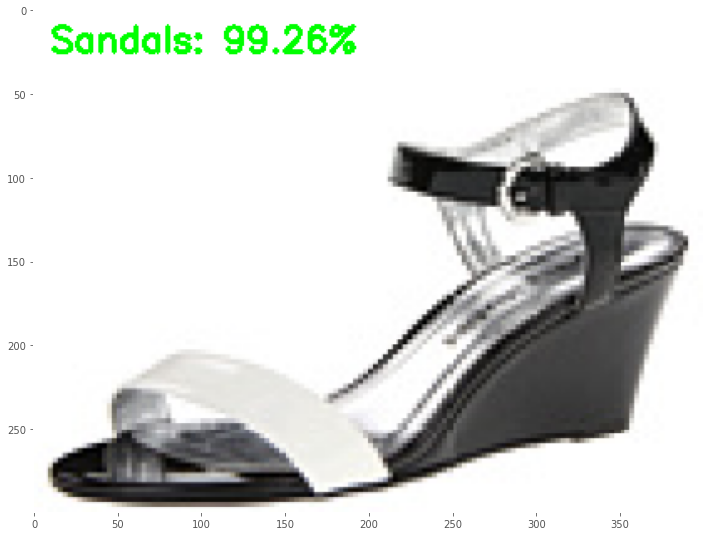

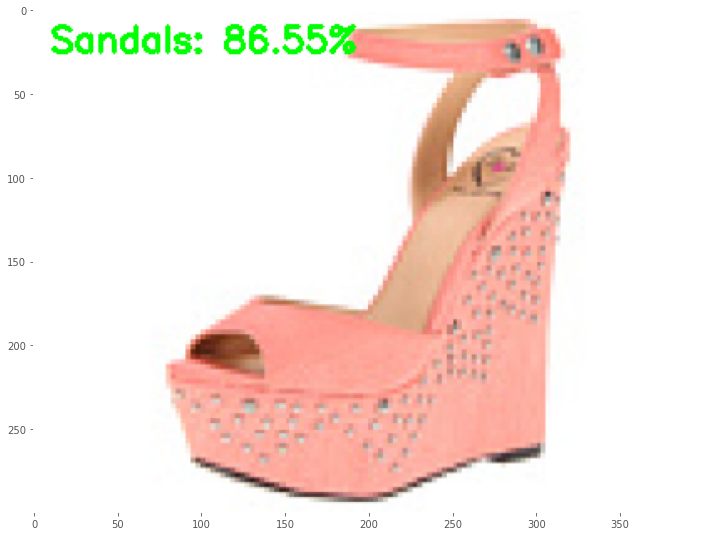

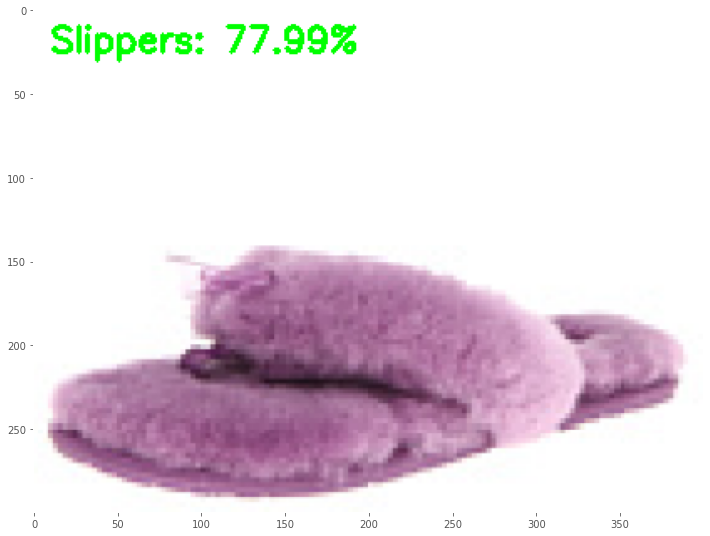

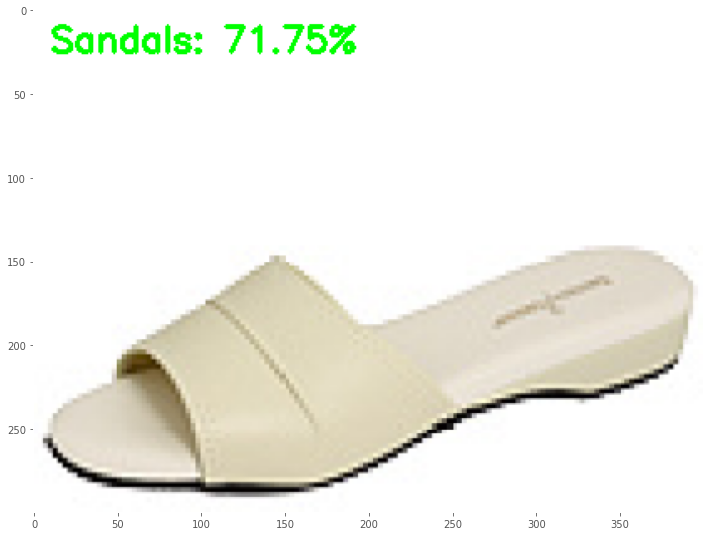

In [33]:
# # load the model 
import imutils

print("[INFO] loading network and...")
# model = load_model(MODEL)

# grab the image paths and randomly shuffle themt
testImagePaths = sorted(list(paths.list_images("test")))   # data folder with 2 categorical folders

all_class = ["Boots", "Sandals", "Slippers"]


# progress bar 
with tqdm(total=len(testImagePaths)) as pbar:
    
    for imagePath in testImagePaths:
        
        # load the image
        image = cv2.imread(imagePath)
        orig = image.copy()

        # pre-process the image for classification
        image = cv2.resize(image, (28, 28))
        image = image.astype("float") / 255.0
        image = img_to_array(image)
        image = np.expand_dims(image, axis=0)

        # classify the input image
        prd_conf = model.predict(image)[0] # [[0.3 0.2 0.5]]

        # build the label
        label = all_class[np.argmax(prd_conf)]
        proba = prd_conf[np.argmax(prd_conf)]

        label = "{}: {:.2f}%".format(label, proba * 100)

        # draw the label on the image
        output = imutils.resize(orig, width=400)
        cv2.putText(output, label, (10, 25),  cv2.FONT_HERSHEY_SIMPLEX,
            0.7, (0, 255, 0), 2)
        
        # convert img to rgb format and display in notebook
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)
        
        pbar.update(1)

In [34]:
!pip install gradio 

     |████████████████████████████████| 2.9 MB 5.2 MB/s 
     |████████████████████████████████| 2.0 MB 37.2 MB/s 
     |████████████████████████████████| 84 kB 2.9 MB/s 
     |████████████████████████████████| 211 kB 36.8 MB/s 
     |████████████████████████████████| 53 kB 1.7 MB/s 
     |████████████████████████████████| 1.1 MB 32.7 MB/s 
     |████████████████████████████████| 54 kB 1.6 MB/s 
     |████████████████████████████████| 253 kB 39.6 MB/s 
     |████████████████████████████████| 144 kB 60.3 MB/s 
     |████████████████████████████████| 94 kB 2.8 MB/s 
     |████████████████████████████████| 271 kB 43.6 MB/s 
     |████████████████████████████████| 58 kB 5.1 MB/s 
     |████████████████████████████████| 10.9 MB 38.8 MB/s 
     |████████████████████████████████| 79 kB 6.1 MB/s 
     |████████████████████████████████| 43 kB 1.7 MB/s 
     |████████████████████████████████| 61 kB 348 kB/s 
     |████████████████████████████████| 856 kB 47.5 MB/s 
     |████████████████████████

In [35]:
import gradio as gr

def predict_image(image):
    # load the image
    
    # pre-process the image for classification
    image = cv2.resize(image, (28, 28))
    image = image.astype("float") / 255.0
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)

        
    preds = model.predict(image)[0]
    result = dict()
    result["Boots"] = round(float(list(preds)[0]), 3)
    result["Sandals"] = round(float(list(preds)[1]), 3)
    result["Slipper"] = round(float(list(preds)[2]), 3)
    
    print(result)
    
    return result

    

In [36]:
im = gr.inputs.Image(shape=(32,32))
label = gr.outputs.Label(num_top_classes=3)

gr.Interface(fn=predict_image, inputs=im, outputs=label, capture_session=True, title="CNN Demo").launch(share=True)

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://52481.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces (https://huggingface.co/spaces)


(<fastapi.applications.FastAPI at 0x7f0c6d457dd0>,
 'http://127.0.0.1:7860/',
 'https://52481.gradio.app')